# Flat-field analysis

In here, we analise a set of flat field frames and build a combined flat.

## Data

The input is a set of 90 flat field raw frames made with this device ![alt text](Flat_device_small.jpeg "Title") 

Used a standard setting of ISO 100, which corresponds to gain=1. The 14mm lens was held at full aperture (the same used for the light frames), and shutter speed was adjusted automatically with the A (Aperture priority) mode so as to generate properly scaled histograms in the three colors.

The indoors and outdoors sets where both made with indirect Sun light.

The data acquisition was conducted in three subsets of 30 frames each, with the camera setup rotated 90 degrees in between each subset. The purpose is to cancel out differences in the overall ligth distribution caused by uneven illumination of the setup (e.g. the Sun shining sideways on the setup).

In between each individual picture, the diffuser cover was slightly repositioned and/or rotated. The purpose is to average over high-frequency uneven features in the light distribution coming from the diffuser (e.g. caused by scratches and stains on the plastic lid).

In [1]:
%pylab notebook
%matplotlib notebook
# %matplotlib inline

import os, glob
import time
from datetime import date

# from dask import delayed

from PIL import Image
from scipy.ndimage.filters import convolve
from astropy.io import fits

import numpy as np
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt

import exifread
import rawpy

Populating the interactive namespace from numpy and matplotlib


## Utility functions 

In [2]:
# Function that combines raw frames from a file list, using a provided numpy 
# combination function. It returns a numpy array with the combined result.
def combine_arrays(file_list, combination_function=np.average):
    
    # Get metadata for reporting purposes
    f = open(file_list[0], 'rb')
    tags = exifread.process_file(f)
    iso = str(tags['EXIF ISOSpeedRatings'])
    exptime = str(tags['EXIF ExposureTime'])
    
    stack = None

    for fname, i in zip(file_list, range(len(file_list))):

        # Build stack. We do not use the scipy/numpy stacking 
        # functions because they clog memory.
        with rawpy.imread(fname) as raw:
            array = raw.raw_image_visible

            # Only now we can create the stack, since array size
            # is unknown before we actually read the first image.
            if stack is None:            
                stack = np.zeros(shape=(array.shape[0],array.shape[1],len(file_list)), dtype='float32')

            # Actual raw DN values are obtained after subtracting the
            # camera-created black level per channel. In the Sony A7, this
            # parameter is the same for all channels, and constant.
            # Just subtract it from everything. No need to subtract an
            # actual dark frame, since the noise in those is so small.
            stack[:,:,i] = array - 512

    # Combine 
    combined = combination_function(stack, axis=2)

    return combined, exptime, iso

In [3]:
# Function that generates plots from a list of numpy arrays.
# The plots are all lined up in a single row. That way, up to 3 plots
# can be placed on the visible window in a notebook page.
# The title string is used to generate the plot titles
def plot_multiple(input_list, title, labels=None, vmin=None, vmax=None):
    figsize(9.5,3)
    
    if labels is None:
        sequence_index = [i+1 for i in range(len(input_list))]
    else:
        sequence_index = labels

    fig = plt.figure() 
    ax = None
    for array, name, i in zip(input_list, sequence_index, range(len(input_list))):
        if ax is None:
            ax = fig.add_subplot(1, len(input_list), i+1)
            ax.set_title(str(sequence_index[i]))    
        else:
            ax1 = fig.add_subplot(1, len(input_list), i+1, sharex=ax, sharey=ax)
            ax1.set_title(str(sequence_index[i]))    

        plt.imshow(array, vmin=vmin, vmax=vmax)
        plt.colorbar()

    fig.suptitle(title)
    plt.show()

In [4]:
# Process the flat fields. The entire set of file names is provided as a single list.
# Three slices are used to select three subsets within that list. 'Name' is used to
# generate the plot titles.
def process(list_raw, slice1, slice2, slice3, name, combination_function=np.average):
    c1, exptime, iso = combine_arrays(list_raw[slice1], combination_function)
    c2, _, _ = combine_arrays(list_raw[slice2], combination_function)
    c3, _, _ = combine_arrays(list_raw[slice3], combination_function)

    diff_1 = c1 - c3
    diff_2 = c2 - c3
    diff_3 = c1 - c2
    
    plot_multiple([c1, c2, c3], name+' '+exptime+'s  ISO '+iso)
    plot_multiple([diff_1, diff_2, diff_3], 'Differences')

## Define path to data files

In [5]:
path = '../astrophotography_data/MilkyWayPrettyBoy/flats/'

## Analysis of uniformness of the light field

The three data subsets (30 frames each) from each data acquisition run, are combined separately, and differences in between the three subsets may tell us something about the overal quality of the flat field that is built by combining all the 90 frames together.

Tried mean and median combinations.



<IPython.core.display.Javascript object>


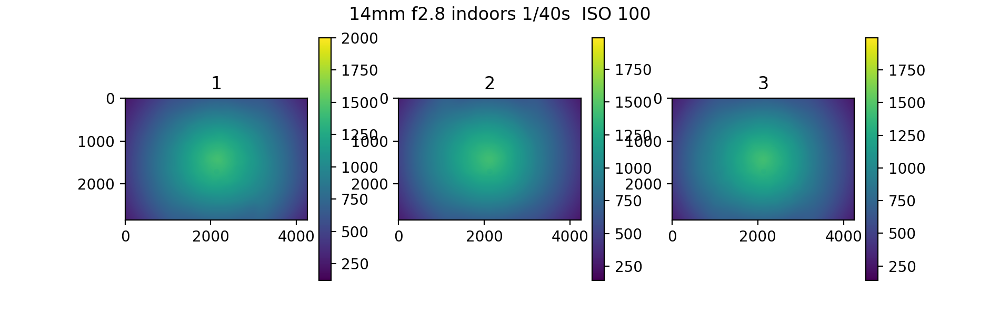

<IPython.core.display.Javascript object>


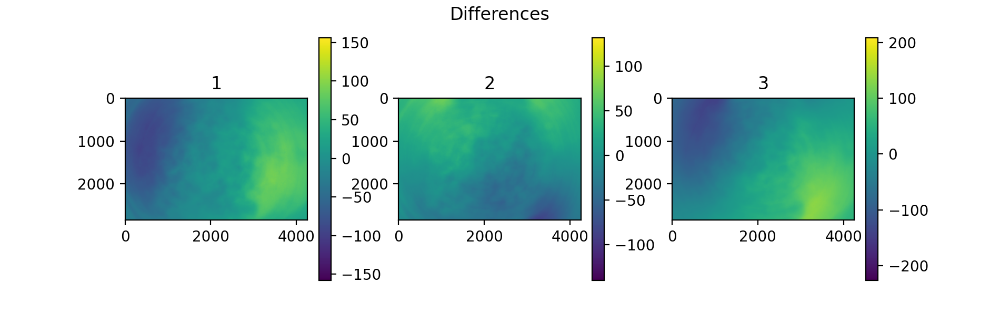

CPU times: user 24.6 s, sys: 4.24 s, total: 28.8 s
Wall time: 30.1 s


In [6]:
%%time
# Flats made indoors - 14mm f2.8
list_raw = glob.glob(path + 'raw_1/*.ARW')
process(list_raw, slice(0,30), slice(31,60), slice(61,90), '14mm f2.8 indoors', combination_function=np.median)

<IPython.core.display.Javascript object>


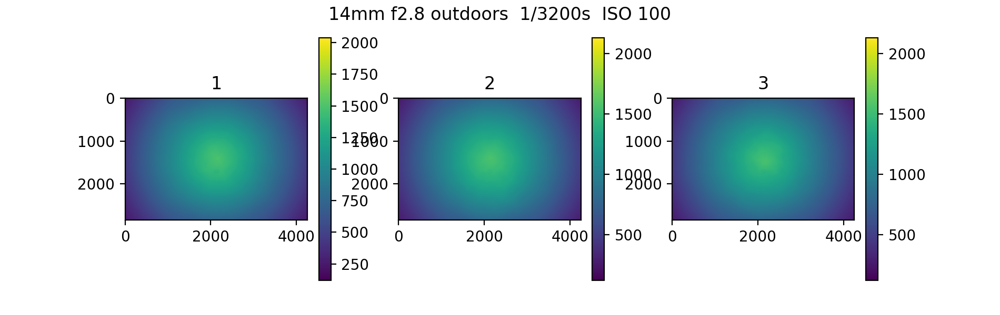

<IPython.core.display.Javascript object>


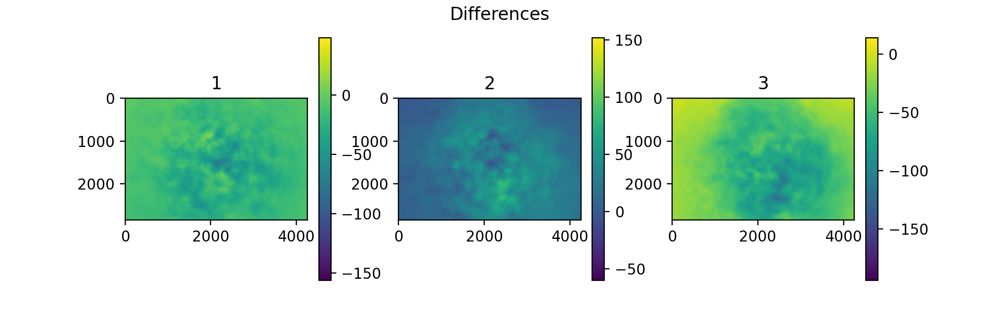

CPU times: user 22.9 s, sys: 4.04 s, total: 26.9 s
Wall time: 28.2 s


In [7]:
%%time
# Flats made outdoors - 14mm f2.8
list_raw = glob.glob(path + 'raw_2/*.ARW')
process(list_raw, slice(0,30), slice(31,60), slice(61,90), '14mm f2.8 outdoors ', combination_function=np.median)

<IPython.core.display.Javascript object>


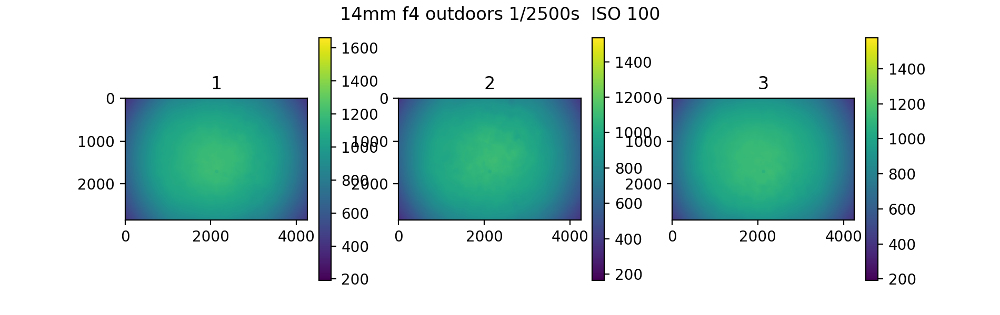

<IPython.core.display.Javascript object>


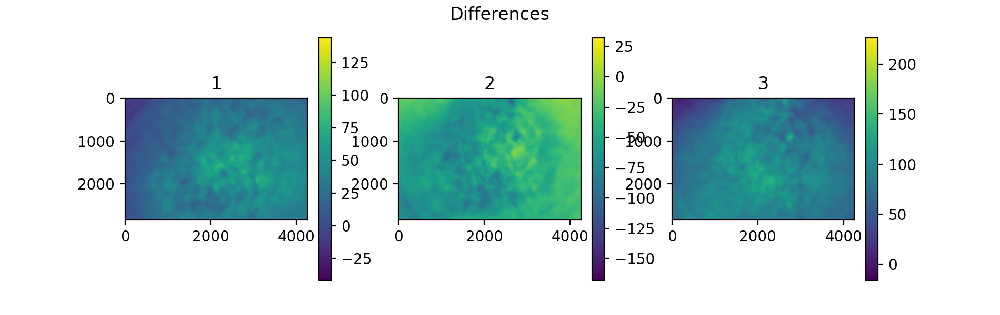

CPU times: user 23.3 s, sys: 5.23 s, total: 28.5 s
Wall time: 29.9 s


In [8]:
%%time
# Flats made outdoors - 14mm f4 for comparison with the f2.8 data sets.
list_raw = glob.glob(path + 'raw_f4/*.ARW')
process(list_raw, slice(0,30), slice(31,60), slice(61,90), '14mm f4 outdoors', combination_function=np.median)

### Conclusion

The difference plots are more uniform, with less structure, for the outdoors subset. Note that the range in DN in these plots is mostly coming from the fact that we have the three RGB colors still mixed together in these non-debayred arrays. Thus no direct noise measurements of the flat field can be made there.

From the diff plots, we can conclude that the best flat field can be derived from the median combination of the 90 frames taken outdoors.

## Analysis of noise in each color channel

Because we cannot extract noise information directly from the raw images, we use standard debayerization to build interpolated RGB arrays. This is justified by the fact that the flat field is very smooth and in practice any interpolation technique applied in the color sub-arrays should give essentially the same result.



In [9]:
%%time
# Build combination from entire data set. Here we use a similar procedure as
# defined in function combine_arrays, but work with the de-bayered arays. Step
# over every other frame to minimize kernel shutdown problems.
list_raw = glob.glob(path + 'raw_2/*.ARW')[::2]

# Build stack. We do not use the scipy/numpy stacking functions because 
# they clog memory.
stack_r = None
stack_g = None
stack_b = None

for fname, i in zip(list_raw, range(len(list_raw))):

    # Read and de-bayer each raw file into a linear image.
    # These settings preserve the raw pixel values into 
    # the output RGB array.
    with rawpy.imread(fname) as raw:
        rgb = raw.postprocess(gamma=(1,1), 
                              output_bps=16,
                              use_camera_wb=False,
                              use_auto_wb=False,
                              no_auto_bright=True, 
                              no_auto_scale=True,
                              output_color=rawpy.ColorSpace.raw)
        red = rgb[::,::,0]
        green = rgb[::,::,1]
        blue = rgb[::,::,2]

        if stack_r is None:            
            stack_r = np.zeros(shape=(red.shape[0],red.shape[1],len(list_raw)), dtype='float32')
            stack_g = np.zeros(shape=(red.shape[0],red.shape[1],len(list_raw)), dtype='float32')
            stack_b = np.zeros(shape=(red.shape[0],red.shape[1],len(list_raw)), dtype='float32')

        stack_r[:,:,i] = red
        stack_g[:,:,i] = green
        stack_b[:,:,i] = blue

        print(i, fname)

print("Stack shape: " + str(stack_r.shape))

# Combine 
c_red = np.median(stack_r, axis=2)
c_green = np.median(stack_g, axis=2)
c_blue = np.median(stack_b, axis=2)

0 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06737.ARW
1 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06722.ARW
2 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06720.ARW
3 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06735.ARW
4 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06709.ARW
5 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06731.ARW
6 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06718.ARW
7 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06724.ARW
8 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06726.ARW
9 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06733.ARW
10 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06783.ARW
11 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06754.ARW
12 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06741.ARW
13 ../astrophotography_data/MilkyWayPrettyBoy/flats/raw_2/DSC06769.ARW
14 ../astrophoto

<IPython.core.display.Javascript object>


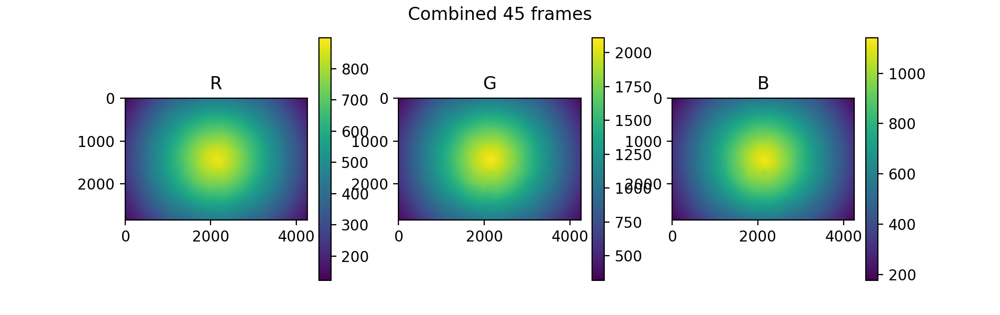

In [10]:
plot_multiple([c_red, c_green, c_blue], 'Combined '+str(len(list_raw))+' frames', labels=['R','G','B'])

In [11]:
# Stats
def stats(array, x, y, size, name):
    slice_x = slice(x,x+100)
    slice_y = slice(y,y+100)
    mean = np.mean(array[slice_x,slice_y])
    std = np.std(array[slice_x,slice_y])
    print(name, "  mean =", mean, "stddev =", std, "(", std/mean, ")", "S/N =", str(mean/std))

size = 100

x = int(c_red.shape[0] / 2)
y = int(c_red.shape[1] / 2)
stats(c_red, x, y, size, "Center R:")
stats(c_green, x, y, size, "Center G:")
stats(c_blue, x, y, size, "Center B:")

x = 10
y = 10
stats(c_red, x, y, size, "Corner R:")
stats(c_green, x, y, size, "Corner G:")
stats(c_blue, x, y, size, "Corner B:")

Center R:   mean = 869.425 stddev = 6.5590835 ( 0.0075441627 ) S/N = 132.55281
Center G:   mean = 2068.817 stddev = 11.42419 ( 0.005522088 ) S/N = 181.09091
Center B:   mean = 1111.4976 stddev = 8.003524 ( 0.007200667 ) S/N = 138.87602
Corner R:   mean = 157.34 stddev = 9.443538 ( 0.060019944 ) S/N = 16.661129
Corner G:   mean = 393.1965 stddev = 19.142218 ( 0.04868359 ) S/N = 20.540802
Corner B:   mean = 204.4381 stddev = 8.697561 ( 0.04254374 ) S/N = 23.50522


## Save flat field to file

#### Using f/4 flat. Does better than f/2.8. Why?

In [12]:
# First, re-build raw flat field array from entire list of input raw files.
# list_raw_final = glob.glob(path + 'raw_f4/*.ARW')

list_raw_final = glob.glob(path + 'raw_2/*.ARW') # f2.8

flat_array, exptime, iso = combine_arrays(list_raw_final, np.median)

In [13]:
# Debayer

# Pick an image just to get the camera's color matrix
path = '../astrophotography_data/MilkyWayPrettyBoy/12800/light'
list_p = glob.glob(os.path.join(path,'*.ARW'))
fname = list_p[1]
raw = rawpy.imread(fname)

# Build RGB masks
colors_array = raw.raw_colors_visible
mask = np.ones(shape=colors_array.shape)

red_mask = np.where(colors_array == 0, 1, 0)

green_mask_1 = np.where(colors_array == 1, 1, 0)
green_mask_2 = np.where(colors_array == 3, 1, 0)
green_mask = green_mask_1 | green_mask_2

blue_mask = np.where(colors_array == 2, 1, 0)

# Convolve with debayer kernels
H_G = np.array(
    [[0, 1, 0],
     [1, 4, 1],
     [0, 1, 0]]) / 4
H_RB = np.array(
    [[1, 2, 1],
     [2, 4, 2],
     [1, 2, 1]]) / 4

flat_red = convolve((flat_array) * red_mask, H_RB)
flat_green = convolve((flat_array) * green_mask, H_G)
flat_blue = convolve((flat_array) * blue_mask, H_RB) 

In [14]:
# TODO median-filter the flat field to danpen high-frequency components.






In [15]:
# # Build 1-extension flat field file with data in raw Bayer matrix
# today = date.today().ctime()
# flat_name = os.path.join(path, 'flat_raw_2.fits')
# print(flat_name, today)

# # Create FITS 1-extension 32-bit floating point file with flat field 
# hdr = fits.Header()
# hdr['DATE'] = today
# hdr['PATH'] = flat_name
# primary_hdu = fits.PrimaryHDU(header=hdr)

# flat_hdu   = fits.ImageHDU(flat_array.astype('float32'))

# hdul = fits.HDUList([primary_hdu, flat_hdu])
# hdul.writeto(flat_name, overwrite=True)

In [16]:
# Build 3-extension flat field file with R,G,B debayred arrays in separate HDUs 
today = date.today().ctime()
flat_name = os.path.join(path, 'flat_raw_3.fits')
print(flat_name, today)

# Create FITS 3-extension 32-bit floating point file with flat field 
hdr = fits.Header()
hdr['DATE'] = today
hdr['PATH'] = flat_name
primary_hdu = fits.PrimaryHDU(header=hdr)

red_hdu   = fits.ImageHDU(flat_red.astype('float32'))
green_hdu = fits.ImageHDU(flat_green.astype('float32'))
blue_hdu  = fits.ImageHDU(flat_blue.astype('float32'))

red_hdu.header['BAND'] = 'RED'
green_hdu.header['BAND'] = 'GREEN'
blue_hdu.header['BAND'] = 'BLUE'

# This uses half the disk space, but may truncate or loose precision.
# image_hdu = fits.ImageHDU(imarray.astype('uint16'))

hdul = fits.HDUList([primary_hdu, red_hdu, green_hdu, blue_hdu])
hdul.writeto(flat_name, overwrite=True)

../astrophotography_data/MilkyWayPrettyBoy/12800/light/flat_raw_3.fits Mon Dec 20 00:00:00 2021


Check that flat file is in good shape.

In [17]:
hdul = fits.open(flat_name)
print(hdul[0].header['PATH'])
print(hdul[0].header['DATE'])
hdul.info()

# For 3-extension file
print(hdul[1].header['BAND'])
print(hdul[2].header['BAND'])
print(hdul[3].header['BAND'])

../astrophotography_data/MilkyWayPrettyBoy/12800/light/flat_raw_3.fits
Mon Dec 20 00:00:00 2021
Filename: ../astrophotography_data/MilkyWayPrettyBoy/12800/light/flat_raw_3.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       6   ()      
  1                1 ImageHDU         8   (4256, 2848)   float32   
  2                1 ImageHDU         8   (4256, 2848)   float32   
  3                1 ImageHDU         8   (4256, 2848)   float32   
RED
GREEN
BLUE


<IPython.core.display.Javascript object>


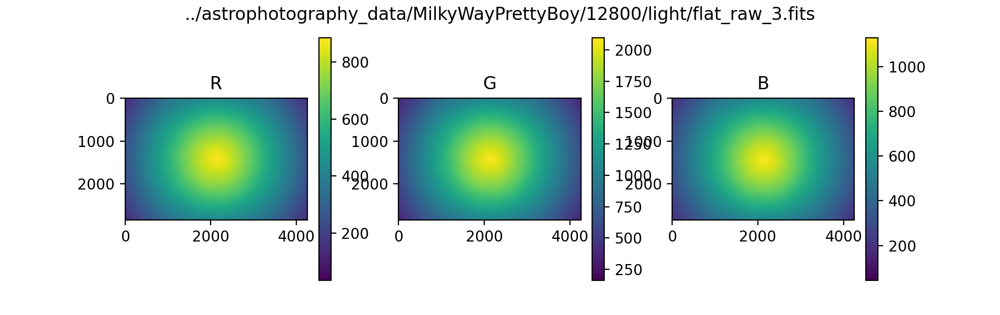

In [18]:
# For 3-extension file
red = hdul[1].data
green = hdul[2].data
blue = hdul[3].data

plot_multiple([red, green, blue], hdul[0].header['PATH'], labels=['R','G','B'])

<IPython.core.display.Javascript object>


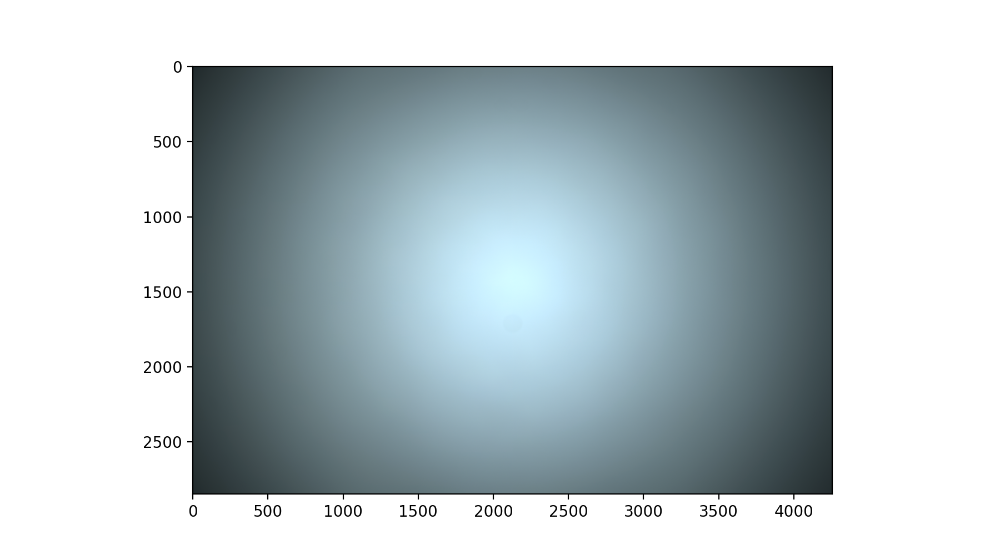

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [19]:
# reassemble bands into RGB image. Scale to fit matplotlib limits.
flat_from_file_rgb_f = np.zeros(shape=(red.shape[0],red.shape[1],3))

norm_factor = max(np.max(red), np.max(green), np.max(blue))

flat_from_file_rgb_f[::,::,0] = red / norm_factor * 2
flat_from_file_rgb_f[::,::,1] = green / norm_factor 
flat_from_file_rgb_f[::,::,2] = blue / norm_factor * 2

plt.figure(figsize=[9, 5])
plt.imshow(flat_from_file_rgb_f)

#### Repeat stats for flat retrieved from file

In [20]:
size = 100

x = int(red.shape[0] / 2)
y = int(red.shape[1] / 2)
stats(red, x, y, size, "Center R:")
stats(green, x, y, size, "Center G:")
stats(blue, x, y, size, "Center B:")

x = 10
y = 10
stats(red, x, y, size, "Corner R:")
stats(green, x, y, size, "Corner G:")
stats(blue, x, y, size, "Corner B:")

Center R:   mean = 864.3553 stddev = 4.304278 ( 0.0049797553 ) S/N = 200.81308
Center G:   mean = 2057.7273 stddev = 10.102467 ( 0.0049095266 ) S/N = 203.68564
Center B:   mean = 1109.1378 stddev = 6.1012926 ( 0.0055009327 ) S/N = 181.78735
Corner R:   mean = 157.9871 stddev = 9.537504 ( 0.060368877 ) S/N = 16.564827
Corner G:   mean = 394.0036 stddev = 19.847366 ( 0.050373565 ) S/N = 19.851683
Corner B:   mean = 205.4665 stddev = 9.031143 ( 0.04395433 ) S/N = 22.750885


## Modeling flat field with a 2-D polynomial 

We gave up on modelling the flat field with a function. It would require a very complex functional form to reproduce all the low-frequency structure found in it. It's best to use th flat field image itself, or a smoothed version of it, to directly divide the raw images by.

In [21]:
def polyfit2d(x, y, z, kx=3, ky=3, order=None):
    '''
    Two dimensional polynomial fitting by least squares.
    Fits the functional form f(x,y) = z.

    Notes
    -----
    Resultant fit can be plotted with:
    np.polynomial.polynomial.polygrid2d(x, y, soln.reshape((kx+1, ky+1)))

    Parameters
    ----------
    x, y: array-like, 1d
        x and y coordinates.
    z: np.ndarray, 2d
        Surface to fit.
    kx, ky: int, default is 3
        Polynomial order in x and y, respectively.
    order: int or None, default is None
        If None, all coefficients up to maxiumum kx, ky, ie. up to and including x^kx*y^ky, are considered.
        If int, coefficients up to a maximum of kx+ky <= order are considered.

    Returns
    -------
    Return paramters from np.linalg.lstsq.

    soln: np.ndarray
        Array of polynomial coefficients.
    residuals: np.ndarray
    rank: int
    s: np.ndarray

    '''
    # grid coords
    x, y = np.meshgrid(x, y)
    # coefficient array, up to x^kx, y^ky
    coeffs = np.ones((kx+1, ky+1))

    # solve array
    a = np.zeros((coeffs.size, x.size))

    # for each coefficient produce array x^i, y^j
    for index, (j, i) in enumerate(np.ndindex(coeffs.shape)):
        # do not include powers greater than order
        if order is not None and i + j > order:
            arr = np.zeros_like(x)
        else:
            arr = coeffs[i, j] * x**i * y**j
        a[index] = arr.ravel()

    # do leastsq fitting and return leastsq result
    return np.linalg.lstsq(a.T, np.ravel(z), rcond=None)

In [22]:
# fitted_surf = np.polynomial.polynomial.polyval2d(x, y, soln.reshape((kx+1,ky+1)))
# plt.matshow(fitted_surf)

# https://scipython.com/blog/non-linear-least-squares-fitting-of-a-two-dimensional-data/

# https://stackoverflow.com/questions/33964913/equivalent-of-polyfit-for-a-2d-polynomial-in-python

In [23]:
# def poly2Dreco(X, Y, c):
#     return (c[0] + X*c[1] + Y*c[2] + X**2*c[3] + X**2*Y*c[4] + X**2*Y**2*c[5] + 
#            Y**2*c[6] + X*Y**2*c[7] + X*Y*c[8])

## Testing normalization by flat field image

One image from highest exposure set (ISO 12800, 3.2s, f/2.8)

In [24]:
# read image file
path = '../astrophotography_data/MilkyWayPrettyBoy/12800/light'
list_p = glob.glob(os.path.join(path,'*.ARW'))
fname = list_p[1]

raw = rawpy.imread(fname)

In [25]:
# debayer
rgb = raw.postprocess(
    demosaic_algorithm=rawpy.DemosaicAlgorithm.LINEAR,
    output_bps=16,
    gamma=(1,1), 
    use_camera_wb=False,
    use_auto_wb=False,
    no_auto_bright=True, 
    no_auto_scale=True,
    output_color=rawpy.ColorSpace.raw
)

red = rgb[::,::,0]
green = rgb[::,::,1]
blue = rgb[::,::,2]

In [26]:
# read flat field and normalize to unity
hdul = fits.open(flat_name)
flat_red = hdul[1].data
flat_green = hdul[2].data
flat_blue = hdul[3].data

norm_factor = max(np.max(flat_red), np.max(flat_green), np.max(flat_blue))

norm_factor = 1000

flat_red /= np.max(flat_red) # norm_factor
flat_green /= np.max(flat_green) # norm_factor
flat_blue /= np.max(flat_blue) # norm_factor

In [27]:
# normalize bands
norm_red = red / flat_red
norm_green = green / flat_green
norm_blue = blue / flat_blue

<IPython.core.display.Javascript object>


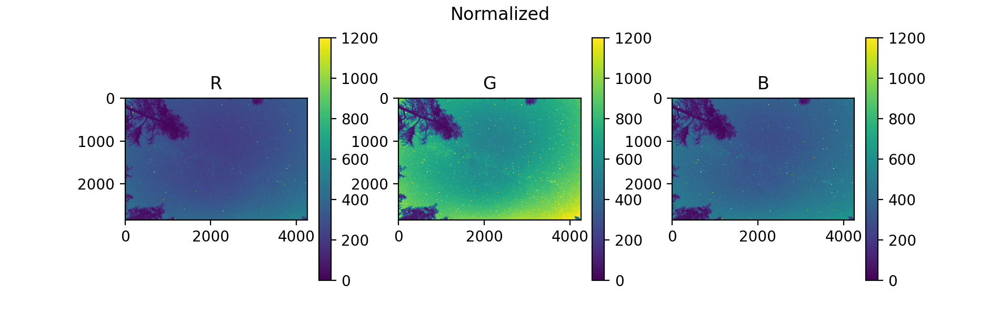

In [28]:
plot_multiple([norm_red, norm_green, norm_blue], 'Normalized', labels=['R','G','B'], vmin=0., vmax=1200)

<IPython.core.display.Javascript object>


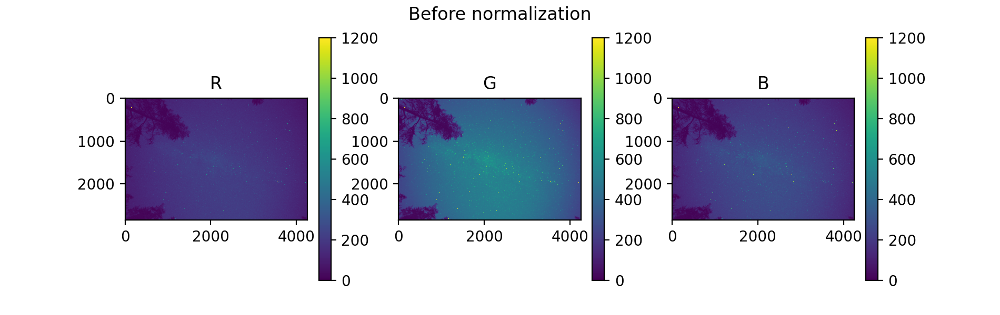

In [29]:
plot_multiple([red, green, blue], 'Before normalization', labels=['R','G','B'], vmin=0., vmax=1200)

<IPython.core.display.Javascript object>


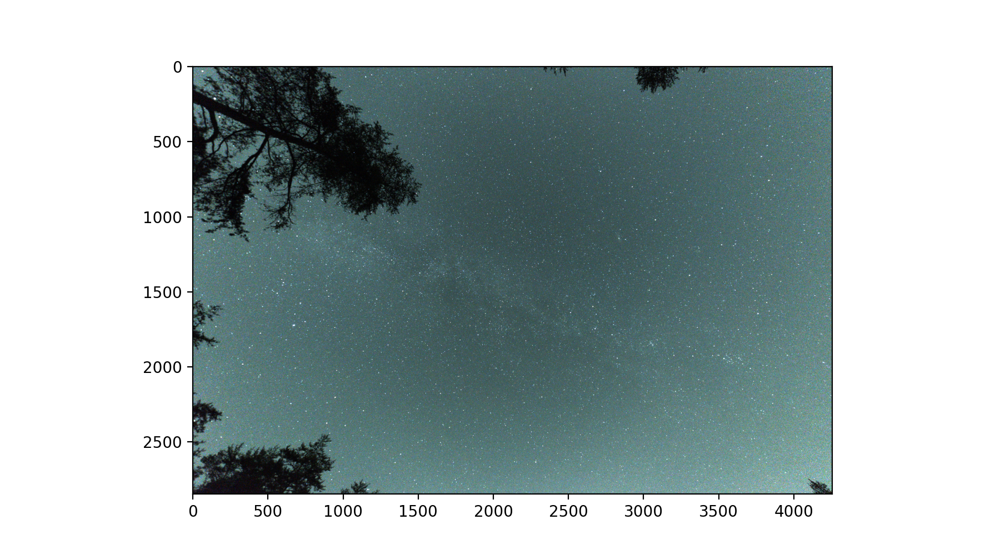

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [30]:
# reassemble bands into RGB image. Scale to fit matplotlib limits.
norm_rgb_scaled = np.zeros(shape=(red.shape[0],red.shape[1],3))

norm_factor = max(np.max(norm_red), np.max(norm_green), np.max(norm_blue))

norm_rgb_scaled[::,::,0] = norm_red / norm_factor * 60 * 1.2
norm_rgb_scaled[::,::,1] = norm_green / norm_factor * 30 * 1.4
norm_rgb_scaled[::,::,2] = norm_blue / norm_factor * 60 * 1.3

plt.figure(figsize=[9, 5])
plt.imshow(norm_rgb_scaled)

Lets do some stats to see why the flat is overcorrecting vignetting.

In [31]:
center = np.index_exp[800:1000,2100:2300]
corner = np.index_exp[200:400,4000:4200]

mean_center_r = np.average(red[center])
mean_corner_r = np.average(red[corner])
mean_center_g = np.average(green[center])
mean_corner_g = np.average(green[corner])
mean_center_b = np.average(blue[center])
mean_corner_b = np.average(blue[corner])

mean_center_flat_r = np.average(flat_red[center])
mean_corner_flat_r = np.average(flat_red[corner])
mean_center_flat_g = np.average(flat_green[center])
mean_corner_flat_g = np.average(flat_green[corner])
mean_center_flat_b = np.average(flat_blue[center])
mean_corner_flat_b = np.average(flat_blue[corner])

mean_center_norm_r = np.average(norm_red[center])
mean_corner_norm_r = np.average(norm_red[corner])
mean_center_norm_g = np.average(norm_green[center])
mean_corner_norm_g = np.average(norm_green[corner])
mean_center_norm_b = np.average(norm_blue[center])
mean_corner_norm_b = np.average(norm_blue[corner])

print(mean_center_r, mean_corner_r, str(mean_center_r / mean_corner_r))
print(mean_center_g, mean_corner_g, str(mean_center_g / mean_corner_g))
print(mean_center_b, mean_corner_b, str(mean_center_b / mean_corner_b))
print()
print(mean_center_flat_r, mean_corner_flat_r, str(mean_center_flat_r / mean_corner_flat_r))
print(mean_center_flat_g, mean_corner_flat_g, str(mean_center_flat_g / mean_corner_flat_g))
print(mean_center_flat_b, mean_corner_flat_b, str(mean_center_flat_b / mean_corner_flat_b))
print()
print(mean_center_norm_r, mean_corner_norm_r, str(mean_center_norm_r / mean_corner_norm_r))
print(mean_center_norm_g, mean_corner_norm_g, str(mean_center_norm_g / mean_corner_norm_g))
print(mean_center_norm_b, mean_corner_norm_b, str(mean_center_norm_b / mean_corner_norm_b))

190.13995 83.85895 2.2673781391252814
453.044425 205.76695 2.201735628583696
247.20715 107.945775 2.2901049161025524

0.851442 0.2458895 3.4627016
0.84829265 0.25515357 3.3246357
0.8422697 0.24854553 3.3887944

223.3153 341.43765 0.65404415
534.0744 807.2762 0.6615758
293.47778 434.93494 0.6747625


It could be that what looks like overcorrection, is actually true sky brightness. Need to test this with a another target image.

<IPython.core.display.Javascript object>


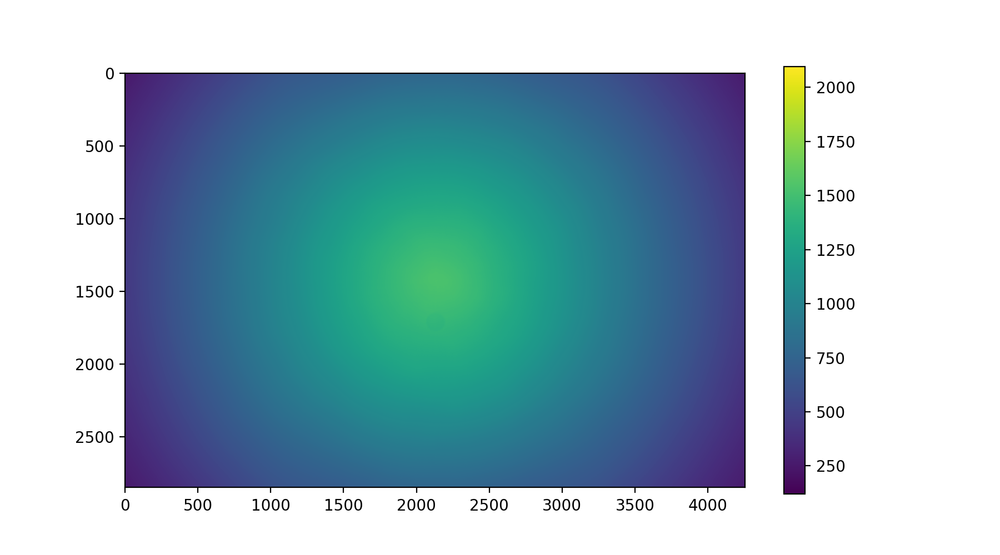

In [32]:
# This is the raw flat array, before debayering
plt.figure(figsize=[9, 5])
plt.imshow(flat_array)
plt.colorbar()

## Test with generic image

In [33]:
filename = '/Users/busko/Pictures/tests/DSC03964.JPG'
im = Image.open(filename)
rgb_a = np.asarray(im)

# The jpeg image is slightly smaller than the flat array.
red_a = rgb_a[::,::,0] / flat_red[0:2832,0:4240]
green_a = rgb_a[::,::,1] / flat_green[0:2832,0:4240]
blue_a = rgb_a[::,::,2] / flat_blue[0:2832,0:4240]

norm_factor = max(np.max(red_a), np.max(green_a), np.max(blue_a))

# norm_factor = 2000

norm_rgb_scaled_a = np.zeros(shape=(red_a.shape[0], red_a.shape[1], 3))
norm_rgb_scaled_a[::,::,0] = red_a / norm_factor * 1.18
norm_rgb_scaled_a[::,::,1] = green_a / norm_factor * 1.4
norm_rgb_scaled_a[::,::,2] = blue_a / norm_factor * 1.3

<IPython.core.display.Javascript object>


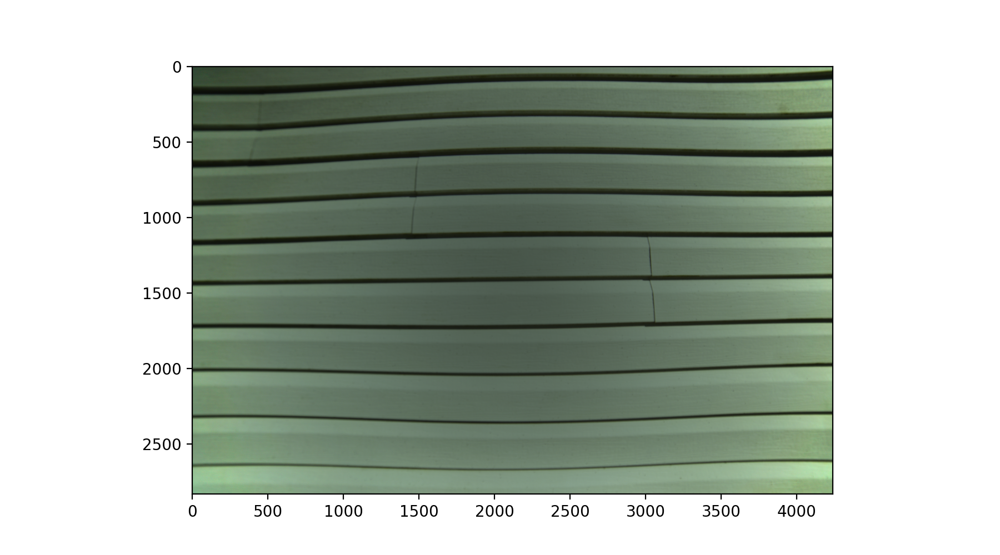

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [34]:
plt.figure(figsize=[9, 5])
plt.imshow(norm_rgb_scaled_a)

<IPython.core.display.Javascript object>


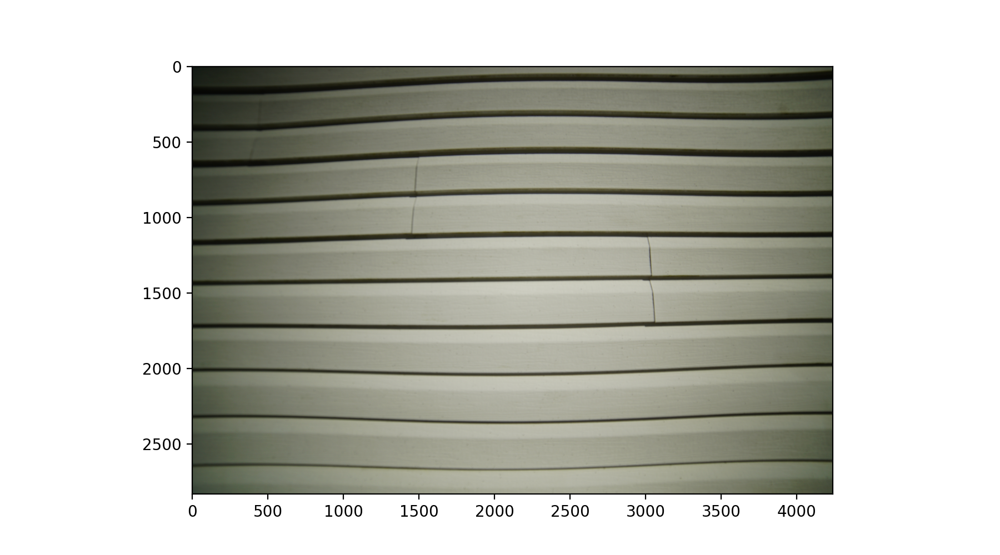

In [35]:
plt.figure(figsize=[9, 5])
plt.imshow(rgb_a)

**Problem 1:** Overcorrection persists with generic image if using f/2.8 flat. Works better with f/4 flat.

Must be something with the rig used to collect the flats?

**Problem 2:** Color shift results from flat field being derived from (yellowish) Sun light. Must normalize with solar spectrum integrated over the R,G,B camera bands.